# Imports

In [6]:
import pandas as pd
import numpy as np
import random
import scipy.stats as st
import re

import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import plotly.offline as pyo
pyo.init_notebook_mode()
plotly.offline.init_notebook_mode (connected = True)

from pathlib import Path
import os
import sys
import io

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import mutual_info_classif

import eli5
from eli5.sklearn import PermutationImportance
import shap

from catboost import CatBoostClassifier

import warnings; warnings.simplefilter('ignore')
sys.path.append('..')

from src import utils
from config import CFG

%matplotlib inline

In [2]:
PATH = Path.cwd().parent

train = pd.read_csv(f'{PATH}/data/train.csv', index_col='Id')
test = pd.read_csv(f'{PATH}/data/test.csv', index_col='Id')
original = pd.read_csv(f'{PATH}/data/WineQT.csv', index_col='Id')

feats = train.drop('quality', axis=1).columns.tolist()
target = 'quality'

display(train.head(3))
display(test.head(3))
display(original.head(3))

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
Id,,,,,,,,,,,,
0,8.0,0.50,0.39,2.2,0.073,30.0,39.0,0.99572,3.33,0.77,12.1,6
1,9.3,0.30,0.73,2.3,0.092,30.0,67.0,0.99854,3.32,0.67,12.8,6
2,7.1,0.51,0.03,2.1,0.059,3.0,12.0,0.99660,3.52,0.73,11.3,7


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
Id,,,,,,,,,,,
2056,7.2,0.510,0.01,2.0,0.077,31.0,54.0,0.99748,3.39,0.59,9.8
2057,7.2,0.755,0.15,2.0,0.102,14.0,35.0,0.99586,3.33,0.68,10.0
2058,8.4,0.460,0.40,2.0,0.065,21.0,50.0,0.99774,3.08,0.65,9.5


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
Id,,,,,,,,,,,,
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5


# Dataframe Exploring

In [61]:
utils.show_info(train)

,index,count,mean,std,min,25%,50%,75%,max,Dtype,Non-Null Count
0,fixed acidity,2056.000000,8.365175,1.705390,5.000000,7.200000,7.950000,9.200000,15.900000,float64,2056 non-null
1,volatile acidity,2056.000000,0.527601,0.173164,0.180000,0.390000,0.520000,0.640000,1.580000,float64,2056 non-null
2,citric acid,2056.000000,0.265058,0.188267,0.000000,0.090000,0.250000,0.420000,0.760000,float64,2056 non-null
3,residual sugar,2056.000000,2.398881,0.858824,1.200000,1.900000,2.200000,2.600000,14.000000,float64,2056 non-null
4,chlorides,2056.000000,0.081856,0.023729,0.012000,0.071000,0.079000,0.090000,0.414000,float64,2056 non-null
5,free sulfur dioxide,2056.000000,16.955982,10.009710,1.000000,8.000000,16.000000,24.000000,68.000000,float64,2056 non-null
6,total sulfur dioxide,2056.000000,49.236868,32.961141,7.000000,22.000000,44.000000,65.000000,289.000000,float64,2056 non-null
7,density,2056.000000,0.996748,0.001827,0.990070,0.995600,0.996700,0.997800,1.003690,float64,2056 non-null
8,pH,2056.000000,3.310569,0.142321,2.740000,3.200000,3.310000,3.390000,3.780000,float64,2056 non-null
9,sulphates,2056.000000,0.641308,0.137942,0.390000,0.550000,0.610000,0.720000,1.950000,float64,2056 non-null


In [62]:
utils.show_info(test)

,index,count,mean,std,min,25%,50%,75%,max,Dtype,Non-Null Count
0,fixed acidity,1372.000000,8.369606,1.664694,4.900000,7.100000,7.900000,9.100000,15.600000,float64,1372 non-null
1,volatile acidity,1372.000000,0.524311,0.176942,0.120000,0.390000,0.500000,0.635000,1.330000,float64,1372 non-null
2,citric acid,1372.000000,0.270569,0.185731,0.000000,0.110000,0.260000,0.420000,0.760000,float64,1372 non-null
3,residual sugar,1372.000000,2.415926,0.921155,1.300000,2.000000,2.200000,2.500000,8.300000,float64,1372 non-null
4,chlorides,1372.000000,0.081307,0.026566,0.012000,0.070000,0.078000,0.087000,0.467000,float64,1372 non-null
5,free sulfur dioxide,1372.000000,17.162536,9.974082,1.000000,8.000000,16.000000,24.000000,68.000000,float64,1372 non-null
6,total sulfur dioxide,1372.000000,49.089286,32.803721,8.000000,23.000000,43.000000,66.000000,165.000000,float64,1372 non-null
7,density,1372.000000,0.996670,0.001822,0.990070,0.995380,0.996600,0.997800,1.003200,float64,1372 non-null
8,pH,1372.000000,3.312223,0.141405,2.740000,3.210000,3.310000,3.390000,4.010000,float64,1372 non-null
9,sulphates,1372.000000,0.647267,0.134792,0.390000,0.550000,0.620000,0.730000,1.620000,float64,1372 non-null


In [63]:
utils.show_info(original)

,index,count,mean,std,min,25%,50%,75%,max,Dtype,Non-Null Count
0,fixed acidity,1143.000000,8.311111,1.747595,4.600000,7.100000,7.900000,9.100000,15.900000,float64,1143 non-null
1,volatile acidity,1143.000000,0.531339,0.179633,0.120000,0.392500,0.520000,0.640000,1.580000,float64,1143 non-null
2,citric acid,1143.000000,0.268364,0.196686,0.000000,0.090000,0.250000,0.420000,1.000000,float64,1143 non-null
3,residual sugar,1143.000000,2.532152,1.355917,0.900000,1.900000,2.200000,2.600000,15.500000,float64,1143 non-null
4,chlorides,1143.000000,0.086933,0.047267,0.012000,0.070000,0.079000,0.090000,0.611000,float64,1143 non-null
5,free sulfur dioxide,1143.000000,15.615486,10.250486,1.000000,7.000000,13.000000,21.000000,68.000000,float64,1143 non-null
6,total sulfur dioxide,1143.000000,45.914698,32.782130,6.000000,21.000000,37.000000,61.000000,289.000000,float64,1143 non-null
7,density,1143.000000,0.996730,0.001925,0.990070,0.995570,0.996680,0.997845,1.003690,float64,1143 non-null
8,pH,1143.000000,3.311015,0.156664,2.740000,3.205000,3.310000,3.400000,4.010000,float64,1143 non-null
9,sulphates,1143.000000,0.657708,0.170399,0.330000,0.550000,0.620000,0.730000,2.000000,float64,1143 non-null


- No missing values, all features are continuous except for maybe the sulfur dioxides, and the target is categorical
- The sulfur dioxide features have a large std, particularly total SD
- The max total SD for the test set is a lot lower than the others

In [64]:
uniques = utils.get_uniques(train, original, feats)

df_unique = pd.DataFrame(uniques)
df_unique = df_unique.set_index('feature')

df_unique.style.background_gradient(subset=['train', 'original'], cmap='Blues')

,train,original,values,orig_values
feature,,,,
fixed acidity,87,91,"[8.0, 9.3, 7.1, 8.1, 8.5, 9.9, 7.2, 7.5, 11.6, 7.8, '...']","[7.4, 7.8, 11.2, 7.9, 7.3, 6.7, 5.6, 8.5, 7.6, 6.9, '...']"
volatile acidity,113,135,"[0.5, 0.3, 0.51, 0.87, 0.36, 0.43, 0.38, 0.78, 0.715, 0.24, '...']","[0.7, 0.88, 0.76, 0.28, 0.66, 0.6, 0.65, 0.58, 0.615, 0.61, '...']"
citric acid,71,77,"[0.39, 0.73, 0.03, 0.22, 0.3, 0.44, 0.0, 0.32, 0.55, 0.09, '...']","[0.0, 0.04, 0.56, 0.06, 0.02, 0.08, 0.29, 0.51, 0.31, 0.21, '...']"
residual sugar,66,80,"[2.2, 2.3, 2.1, 2.6, 1.8, 2.4, 2.7, 2.8, 3.0, 1.9, '...']","[1.9, 2.6, 2.3, 1.8, 1.6, 1.2, 2.0, 2.4, 1.4, 5.5, '...']"
chlorides,103,131,"[0.073, 0.092, 0.059, 0.084, 0.079, 0.111, 0.08, 0.066, 0.049, 0.086, '...']","[0.076, 0.098, 0.092, 0.075, 0.069, 0.065, 0.073, 0.0969999999999999, 0.089, 0.114, '...']"
free sulfur dioxide,49,53,"[30.0, 3.0, 11.0, 10.0, 6.0, 18.0, 17.0, 13.0, 23.0, 31.0, '...']","[11.0, 25.0, 15.0, 17.0, 13.0, 9.0, 16.0, 35.0, 23.0, 10.0, '...']"
total sulfur dioxide,126,138,"[39.0, 67.0, 12.0, 65.0, 45.0, 134.0, 18.0, 40.0, 29.0, 110.0, '...']","[34.0, 67.0, 54.0, 60.0, 40.0, 59.0, 21.0, 18.0, 65.0, 29.0, '...']"
density,313,388,"[0.99572, 0.99854, 0.9966, 0.9973, 0.99444, 0.9982, 0.99552, 0.9956, 1.0008, 0.99682, '...']","[0.9978, 0.9968, 0.997, 0.998, 0.9964, 0.9946, 0.9959, 0.9943, 0.9974, 0.9969, '...']"
pH,77,87,"[3.33, 3.32, 3.52, 3.2, 3.11, 3.34, 3.3, 3.17, 3.51, 3.31, '...']","[3.51, 3.2, 3.26, 3.16, 3.3, 3.39, 3.36, 3.28, 3.58, 3.04, '...']"


# Plots

## Distributions

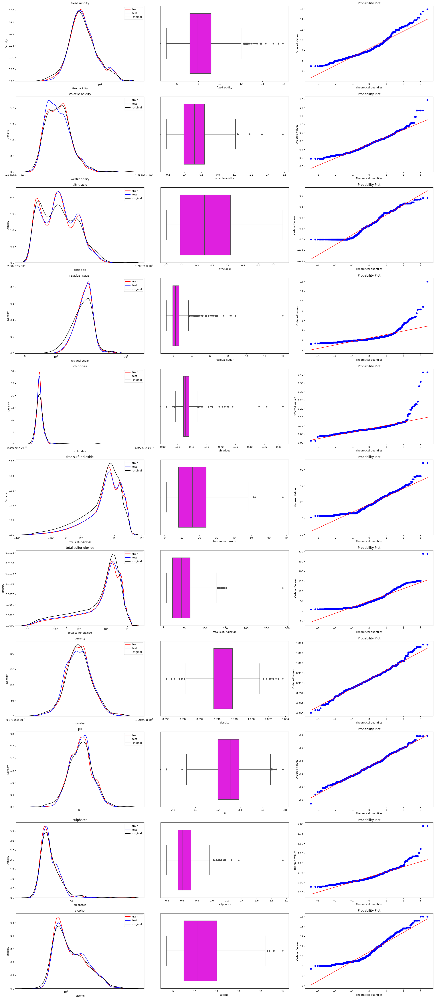

In [68]:
qty = len(feats)
ncols, nrows, r = 3, qty, 0

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(24, 5*nrows))
for f in feats:
    sns.kdeplot(train[f], color='red', label='train', ax=axes[r, 0])
    sns.kdeplot(test[f], color='blue', label='test', ax=axes[r, 0])
    sns.kdeplot(original[f], color='black', label='original', ax=axes[r, 0])
    axes[r, 0].set_title(f)
    axes[r, 0].set_xscale('symlog')
    axes[r, 0].legend()
    sns.boxplot(x=train[f], ax=axes[r, 1], color='magenta')
    st.probplot(train[f], plot=axes[r, 2])
    r += 1
plt.tight_layout()
plt.show()

## Correlations

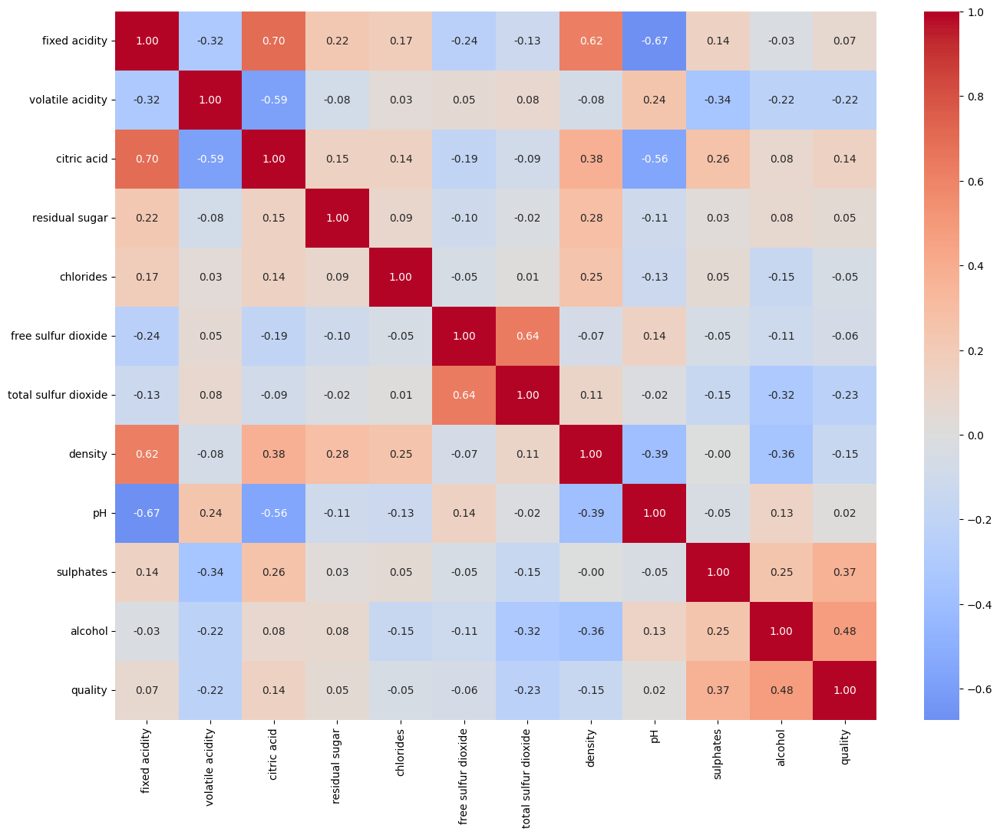

In [69]:
plt.figure(figsize=(16, 12))
sns.heatmap(train[feats + [target]].corr(), center=0, annot=True, fmt='.2f', cmap='coolwarm')
plt.show()

## Pairplots

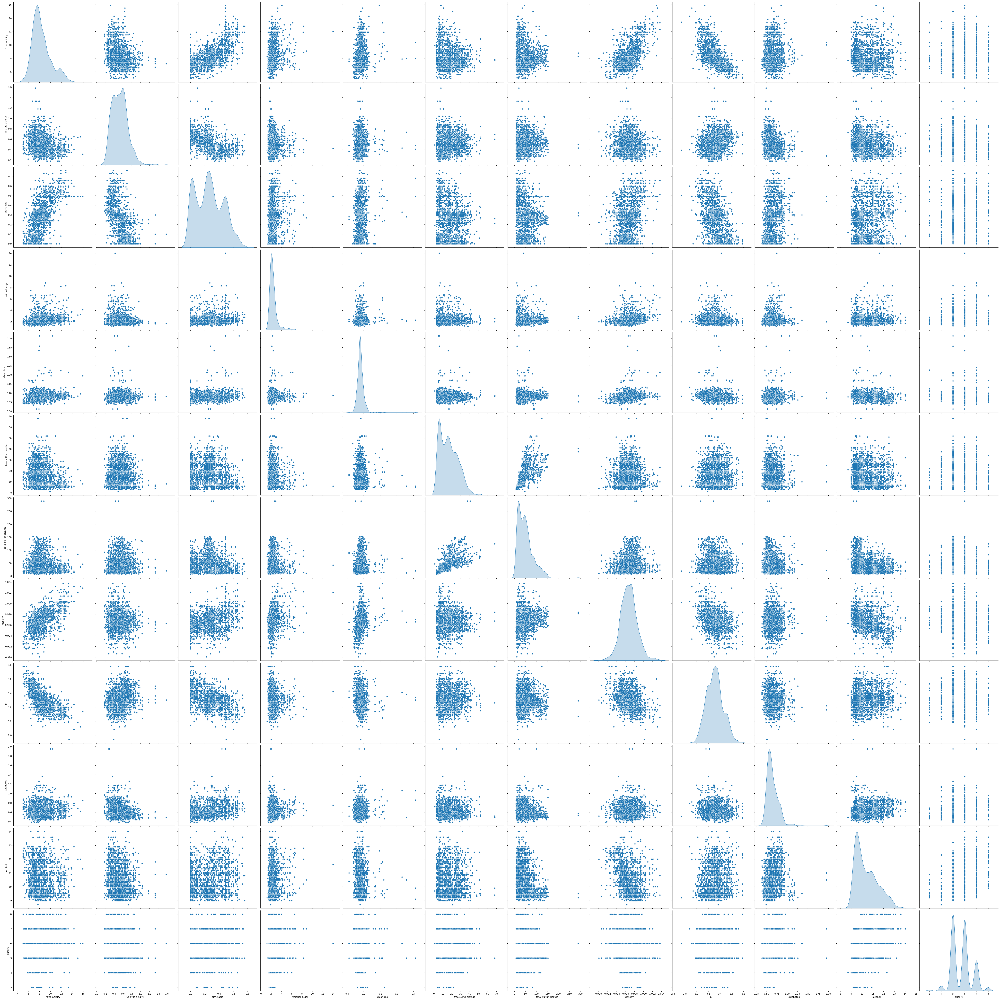

In [70]:
sns.pairplot(train[train.columns], height=5, kind='scatter', diag_kind='kde')

## Quality Categories

In [71]:
avg_quality = train.groupby('quality').mean()
avg_quality.style.background_gradient(subset=feats, cmap='Blues')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
quality,,,,,,,,,,,
3,8.850000,0.570000,0.335000,2.241667,0.106333,12.916667,37.166667,0.997498,3.258333,0.593333,9.816667
4,8.080000,0.543182,0.233273,2.377273,0.080691,17.954545,54.690909,0.996969,3.335455,0.615091,9.727273
5,8.200119,0.574210,0.232026,2.384923,0.082779,17.874851,59.679380,0.997035,3.308725,0.586186,9.901490
6,8.465296,0.504441,0.281350,2.347365,0.080927,16.185733,42.428021,0.996636,3.307905,0.660026,10.640317
7,8.582883,0.465511,0.306456,2.569970,0.081402,16.851351,39.855856,0.996293,3.317658,0.729970,11.189990
8,8.312821,0.482051,0.320513,2.344872,0.078513,13.282051,36.538462,0.996141,3.323846,0.748462,11.502564


<AxesSubplot: xlabel='quality'>

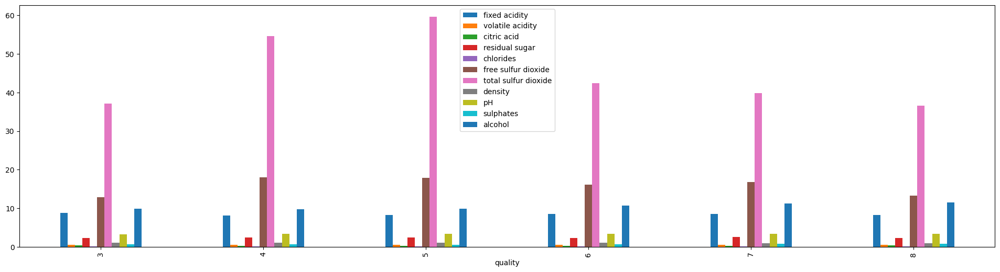

In [73]:
avg_quality.plot(kind='bar', figsize=(24, 6))

- no visible relationships: lets scale and bin it to see if that helps

In [74]:
sc = StandardScaler()
train_scaled = train.copy()
train_scaled[feats] = sc.fit_transform(train_scaled[feats])
train_scaled['group'] = 'medium'
train_scaled.loc[train_scaled['quality'] < 5, 'group'] = 'low'
train_scaled.loc[train_scaled['quality'] < 7, 'group'] = 'high'
avg_quality_scaled = train_scaled.groupby(['quality', 'group']).mean()
avg_quality_scaled.style.background_gradient(subset=feats, cmap='Blues')

,,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
quality,group,,,,,,,,,,,
3,high,0.284359,0.244910,0.371592,-0.183103,1.031799,-0.403638,-0.366284,0.410849,-0.367116,-0.347877,-0.581684
4,high,-0.167261,0.090001,-0.168874,-0.025167,-0.049114,0.099784,0.165509,0.120975,0.174897,-0.190108,-0.668595
5,high,-0.096808,0.269227,-0.175496,-0.016257,0.038927,0.091820,0.316890,0.157102,-0.012963,-0.399704,-0.499217
6,high,0.058723,-0.133777,0.086554,-0.059999,-0.039173,-0.076969,-0.206622,-0.061183,-0.018724,0.135723,0.219084
7,medium,0.127690,-0.358650,0.219943,0.199261,-0.019122,-0.010456,-0.284677,-0.248759,0.049819,0.642903,0.753487
8,medium,-0.030707,-0.263106,0.294623,-0.062903,-0.140927,-0.367126,-0.385348,-0.332198,0.093312,0.776989,1.057377


<AxesSubplot: xlabel='quality,group'>

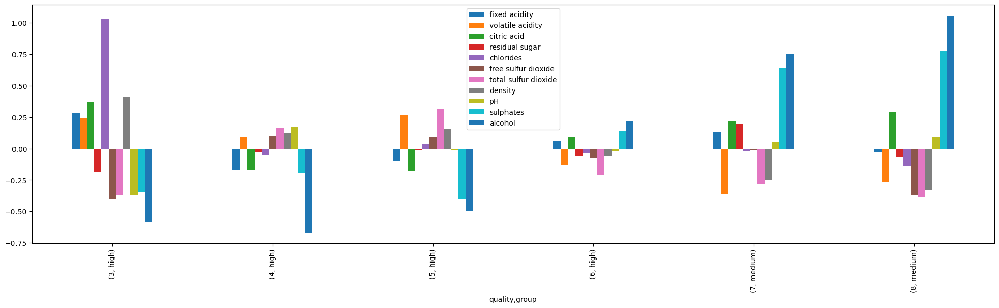

In [75]:
avg_quality_scaled.plot(kind="bar",figsize=(24,6))

- much better, positive relationship with alcohol and sulfates

# Radar Plot

In [80]:
avr = train_scaled.groupby([target]).mean()
av = avr.to_dict()
data = []
for q in range(3, 9):
    for f in feats:
        item = {}
        item['features'] = f
        item[target] = q
        item['scaled_val'] = av[f][q]
        data.append(item)

df = pd.DataFrame(data)

fig = plt.figure(figsize=(8, 8))
px.line_polar(df, r='scaled_val', theta='features', line_close=True, template='plotly_dark', animation_frame=target)

<Figure size 800x800 with 0 Axes>

In [84]:
px.line_polar(df, r='scaled_val', theta='features', line_close=True, color=target)

<AxesSubplot: xlabel='group'>

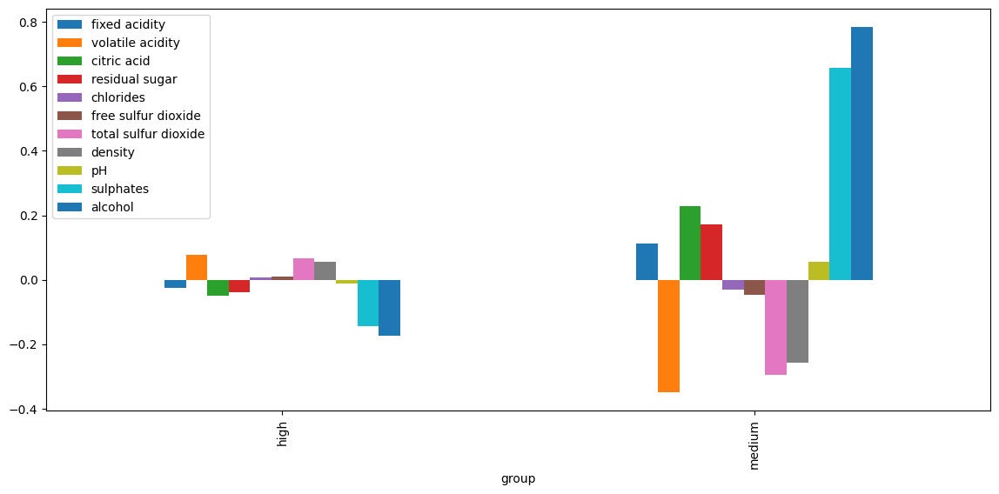

In [85]:
average_group_quality_scaled = train_scaled[feats+['group']].groupby('group').mean()
average_group_quality_scaled.plot(kind="bar",figsize=(14,6))

- Feature engineering ideas from this: get stats/operations on alcohol and sulfates as they are consistent/predictable throughout the quality

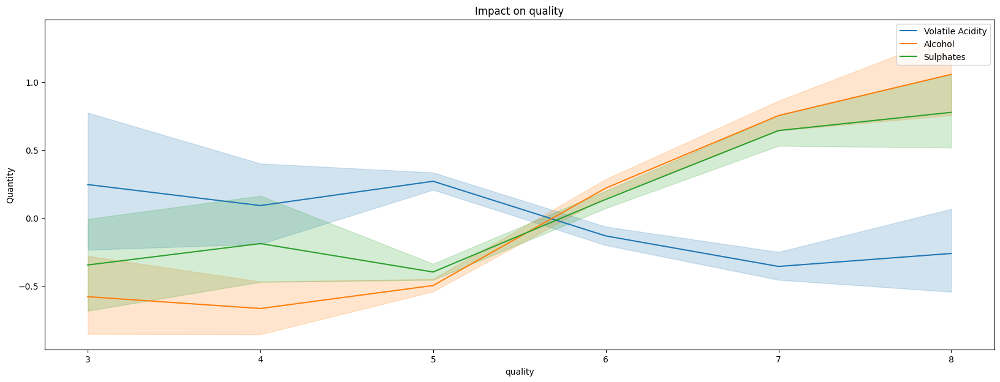

In [86]:
plt.figure(figsize=(20,7))
sns.lineplot(data=train_scaled, x="quality",y="volatile acidity",label="Volatile Acidity")
# sns.lineplot(data=train_scaled, x="quality",y="citric acid",label="Citric Acid")
# sns.lineplot(data=train_scaled, x="quality",y="chlorides",label="chlorides")
sns.lineplot(data=train_scaled, x="quality",y="alcohol",label="Alcohol")
sns.lineplot(data=train_scaled, x="quality",y="sulphates",label="Sulphates")
plt.ylabel("Quantity")
plt.title("Impact on quality")
plt.legend()
plt.show()

## Distribution of Features by Quality

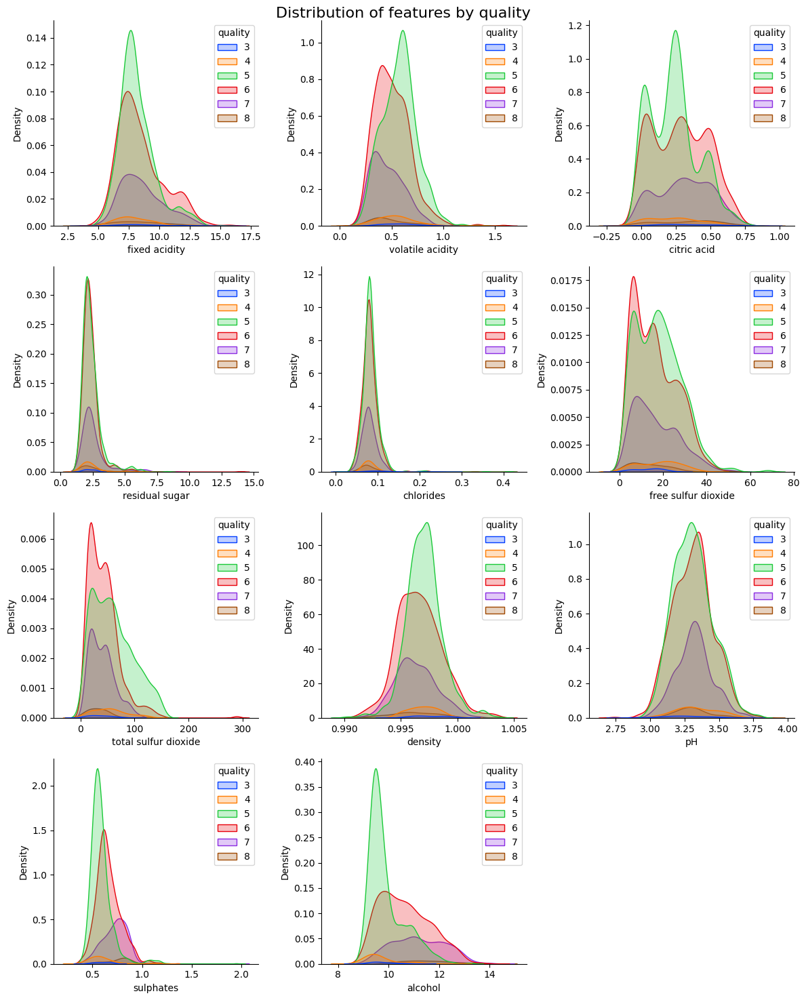

In [8]:
fig, axes = plt.subplots(4, 3, figsize=(12, 15))

for ax, feat in zip(axes.ravel(), feats):
    sns.kdeplot(data=train, x=feat, hue='quality', ax=ax, fill=True, palette='bright')
    sns.despine()

for ax in axes.ravel()[len(feats):]:
    ax.set_visible(False)

plt.suptitle('Distribution of features by quality', fontsize=16)
fig.tight_layout()
plt.show()

# Mutual Information

,feature,MI_score
0,sulphates,0.181102
1,alcohol,0.137118
2,total sulfur dioxide,0.034524
3,fixed acidity,0.033978
4,citric acid,0.033207
5,density,0.023808
6,volatile acidity,0.016994
7,free sulfur dioxide,0.005623
8,residual sugar,0.000000
9,chlorides,0.000000


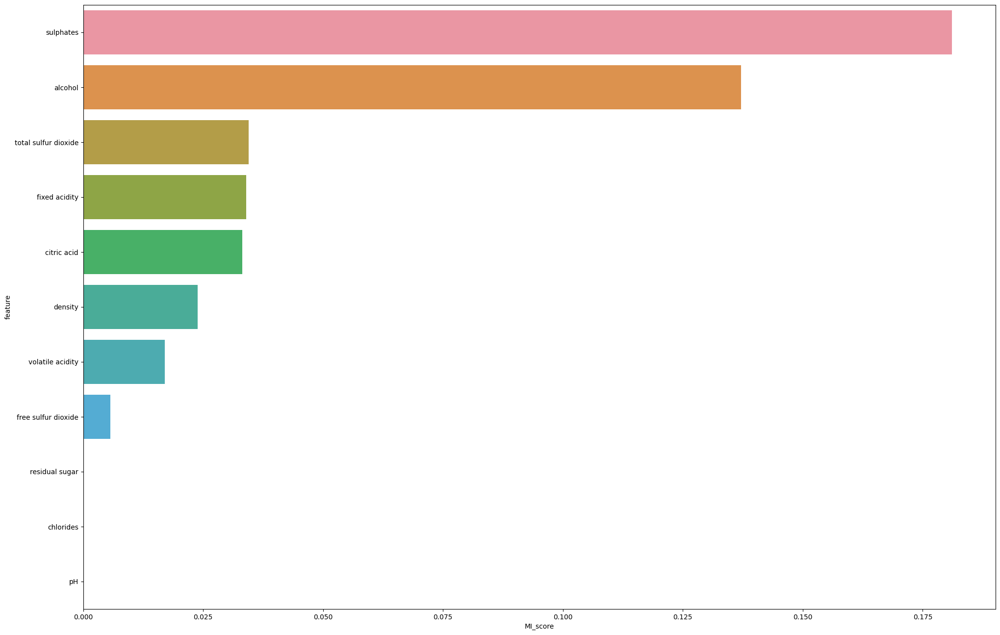

In [5]:
X_train = train.drop([target], axis=1)
y_train = train[target]

mi_scores = mutual_info_classif(X_train, y_train, random_state=CFG.SEED)
    
mi_scores = pd.Series(mi_scores, name="MI_score", index=X_train.columns)
mi_scores = mi_scores.sort_values(ascending=False)
df_mi_scores = pd.DataFrame(mi_scores).reset_index().rename(columns={'index':'feature'})
display(df_mi_scores.style.background_gradient(subset=['MI_score'], cmap='Reds'))
plt.figure(figsize=(24, 16))
sns.barplot(y=df_mi_scores['feature'], x=df_mi_scores['MI_score'])
plt.show()

## Permutation Importance

In [8]:
model = CatBoostClassifier(verbose=0)

perm_train, perm_test, perm_y, perm_valid_y = train_test_split(X_train, y_train)
perm_model = model.fit(perm_train, perm_y)
perm = PermutationImportance(perm_model, random_state=1).fit(perm_test, perm_valid_y)
eli5.show_weights(perm, feature_names = perm_test.columns.tolist(), top=None)

Weight,Feature
0.0603 ± 0.0230,sulphates
0.0467 ± 0.0226,alcohol
0.0160 ± 0.0126,total sulfur dioxide
0.0019 ± 0.0198,density
-0.0066 ± 0.0125,pH
-0.0086 ± 0.0294,volatile acidity
-0.0089 ± 0.0243,free sulfur dioxide
-0.0097 ± 0.0179,residual sugar
-0.0105 ± 0.0091,chlorides
-0.0125 ± 0.0147,citric acid


In [7]:
train[target].value_counts()

5    839
6    778
7    333
4     55
8     39
3     12
Name: quality, dtype: int64

- We have some pretty nasty imbalance here that we will need to figure out how to deal with

- Here we are looking for histograms were the quality groups are a different shape from one another
- Alcohol, total sulfur dioxide and sulphates look like they could be good